Data Overview and Cleaning

In [2]:
# Segment 1: Import & Load Data
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
MAIN_COLOR = '#1f77b4'   # blue
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=[MAIN_COLOR])

file_path = "Airbnb_Open_Data.csv"
df = pd.read_csv(file_path, low_memory=False)

print("Shape of raw data:", df.shape)
df.head()

Shape of raw data: (102599, 81)


,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,Unnamed: 71,Unnamed: 72,Unnamed: 73,Unnamed: 74,Unnamed: 75,Unnamed: 76,Unnamed: 77,Unnamed: 78,Unnamed: 79,Unnamed: 80
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,United States,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,United States,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,NaN,Elise,Manhattan,Harlem,40.80902,-73.94190,United States,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1002755,NaN,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.68514,-73.95976,United States,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.79851,-73.94399,United States,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
# Segment 2: Missing Values Overview
missing_counts = df.isna().sum().sort_values(ascending=False)
missing_counts, (missing_counts/len(df))*100

(Unnamed: 45    102599
 Unnamed: 33    102599
 Unnamed: 34    102599
 Unnamed: 35    102599
 Unnamed: 36    102599
                 ...  
 lat                 8
 long                8
 room type           0
 id                  0
 host id             0
 Length: 81, dtype: int64,
 Unnamed: 45    100.000000
 Unnamed: 33    100.000000
 Unnamed: 34    100.000000
 Unnamed: 35    100.000000
 Unnamed: 36    100.000000
                   ...    
 lat              0.007797
 long             0.007797
 room type        0.000000
 id               0.000000
 host id          0.000000
 Length: 81, dtype: float64)

In [4]:
# Segment 3: Clean price & service fee
df['price'] = df['price'].astype(str).str.replace('$','').str.strip()
df['price'] = pd.to_numeric(df['price'], errors='coerce')

df['service fee'] = df['service fee'].astype(str).str.replace('$','').str.strip()
df['service fee'] = pd.to_numeric(df['service fee'], errors='coerce')

mask = df['service fee'].isna() & df['price'].notna()
df.loc[mask, 'service fee'] = (df.loc[mask, 'price'] * 0.20).round(0)

df[['price','service fee']].head()

,price,service fee
0,966.0,193.0
1,142.0,28.0
2,620.0,124.0
3,368.0,74.0
4,204.0,41.0


In [5]:
df.shape

(102599, 81)

In [6]:
# Segment 4: Drop critical missing rows
critical_cols = ['id','host id','lat','long','price']
df = df.dropna(subset=critical_cols)
df.shape

(84442, 81)

In [7]:
# Segment 5: Fill categorical columns
def fill_with_mode(df, col):
    m = df[col].mode(dropna=True)
    if len(m)>0:
        df[col] = df[col].fillna(m[0])

df['host_identity_verified'] = df['host_identity_verified'].fillna('unverified')

for col in ['neighbourhood group','neighbourhood','country','country code']:
    df[col] = df[col].fillna('Unknown')

for col in ['instant_bookable','cancellation_policy','room type']:
    fill_with_mode(df, col)

df.head()

/tmp/ipython-input-1337978625.py:5: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].fillna(m[0])


,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,Unnamed: 71,Unnamed: 72,Unnamed: 73,Unnamed: 74,Unnamed: 75,Unnamed: 76,Unnamed: 77,Unnamed: 78,Unnamed: 79,Unnamed: 80
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,United States,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,United States,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,unverified,Elise,Manhattan,Harlem,40.80902,-73.94190,United States,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1002755,NaN,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.68514,-73.95976,United States,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.79851,-73.94399,United States,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN



Drop Columns with All Missing Values

In [8]:
# Segment 2.6: Drop Columns with All Missing Values
try:
    missing_percentage = df.isnull().sum() * 100 / len(df)
    # Get columns where missing percentage is 100
    columns_to_drop = missing_percentage[missing_percentage == 100].index.tolist()

    print(f"Columns to drop (100% missing values): {columns_to_drop}")

    df = df.drop(columns=columns_to_drop)
    print("Shape after dropping fully null columns:", df.shape)

    # Final check of missing values
    print("\nRemaining missing values (top 10):\n", df.isnull().sum().sort_values(ascending=False).head(10))
except NameError:
    print("Error: DataFrame 'df' is not defined. Please ensure you have run all preceding cells to load and prepare the data.")
except Exception as e:
    print(f"An unexpected error occurred: {e}")


Columns to drop (100% missing values): ['Unnamed: 26', 'Unnamed: 27', 'Unnamed: 28', 'Unnamed: 29', 'Unnamed: 30', 'Unnamed: 31', 'Unnamed: 32', 'Unnamed: 33', 'Unnamed: 34', 'Unnamed: 35', 'Unnamed: 36', 'Unnamed: 37', 'Unnamed: 38', 'Unnamed: 39', 'Unnamed: 40', 'Unnamed: 41', 'Unnamed: 42', 'Unnamed: 43', 'Unnamed: 44', 'Unnamed: 45', 'Unnamed: 46', 'Unnamed: 47', 'Unnamed: 48', 'Unnamed: 49', 'Unnamed: 50', 'Unnamed: 51', 'Unnamed: 52', 'Unnamed: 53', 'Unnamed: 54', 'Unnamed: 55', 'Unnamed: 56', 'Unnamed: 57', 'Unnamed: 58', 'Unnamed: 59', 'Unnamed: 60', 'Unnamed: 61', 'Unnamed: 62', 'Unnamed: 63', 'Unnamed: 64', 'Unnamed: 65', 'Unnamed: 66', 'Unnamed: 67', 'Unnamed: 68', 'Unnamed: 69', 'Unnamed: 70', 'Unnamed: 71', 'Unnamed: 72', 'Unnamed: 73', 'Unnamed: 74', 'Unnamed: 75', 'Unnamed: 76', 'Unnamed: 77', 'Unnamed: 78', 'Unnamed: 79']
Shape after dropping fully null columns: (84442, 27)

Remaining missing values (top 10):
 Unnamed: 80                       84441
license             

In [9]:
# Segment 6: Fill numeric columns
df['number of reviews'] = df['number of reviews'].fillna(0)
df['reviews per month'] = df['reviews per month'].fillna(0)
df['calculated host listings count'] = df['calculated host listings count'].fillna(1)

for col in ['minimum nights','Construction year','review rate number','availability 365']:
    df[col] = df[col].fillna(df[col].median())

df.head()

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license,Unnamed: 80
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,United States,...,10.0,9.0,10/19/2021,0.21,4.0,6.0,286.0,Clean up and treat the home the way you'd like...,NaN,0.0
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,United States,...,30.0,45.0,5/21/2022,0.38,4.0,2.0,228.0,Pet friendly but please confirm with me if the...,NaN,NaN
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,unverified,Elise,Manhattan,Harlem,40.80902,-73.94190,United States,...,3.0,0.0,NaN,0.00,5.0,1.0,352.0,"I encourage you to use my kitchen, cooking and...",NaN,NaN
3,1002755,NaN,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.68514,-73.95976,United States,...,30.0,270.0,7/5/2019,4.64,4.0,1.0,322.0,NaN,NaN,NaN
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.79851,-73.94399,United States,...,10.0,9.0,11/19/2018,0.10,3.0,1.0,289.0,"Please no smoking in the house, porch or on th...",NaN,NaN


In [10]:
# Segment 7: Fill text columns
df['NAME'] = df['NAME'].fillna('Unknown listing')
df['host name'] = df['host name'].fillna('Unknown host')
df['last review'] = df['last review'].fillna('No review')
df['house_rules'] = df['house_rules'].fillna('No rules provided')
df['license'] = df['license'].fillna('Unknown')

df.head()

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license,Unnamed: 80
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,United States,...,10.0,9.0,10/19/2021,0.21,4.0,6.0,286.0,Clean up and treat the home the way you'd like...,Unknown,0.0
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,United States,...,30.0,45.0,5/21/2022,0.38,4.0,2.0,228.0,Pet friendly but please confirm with me if the...,Unknown,NaN
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,unverified,Elise,Manhattan,Harlem,40.80902,-73.94190,United States,...,3.0,0.0,No review,0.00,5.0,1.0,352.0,"I encourage you to use my kitchen, cooking and...",Unknown,NaN
3,1002755,Unknown listing,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.68514,-73.95976,United States,...,30.0,270.0,7/5/2019,4.64,4.0,1.0,322.0,No rules provided,Unknown,NaN
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.79851,-73.94399,United States,...,10.0,9.0,11/19/2018,0.10,3.0,1.0,289.0,"Please no smoking in the house, porch or on th...",Unknown,NaN


In [11]:
# Segment 8: Final check
df.isna().sum().sort_values(ascending=False), df.shape

(Unnamed: 80                       84441
 NAME                                  0
 id                                    0
 host_identity_verified                0
 host name                             0
 neighbourhood group                   0
 neighbourhood                         0
 lat                                   0
 long                                  0
 country                               0
 host id                               0
 country code                          0
 instant_bookable                      0
 room type                             0
 cancellation_policy                   0
 price                                 0
 service fee                           0
 minimum nights                        0
 Construction year                     0
 number of reviews                     0
 last review                           0
 review rate number                    0
 reviews per month                     0
 calculated host listings count        0
 availability 36

In [12]:
# ==========================
# Segment 3.5: Handle Duplicates
# ==========================

# 1) Check full-row duplicates
full_dups = df.duplicated().sum()
print(f"Number of fully duplicated rows: {full_dups}")

# Drop fully duplicated rows (if any)
df = df.drop_duplicates()
print("Shape after dropping full-row duplicates:", df.shape)

# 2) Check duplicates based only on 'id'
id_dups = df['id'].duplicated().sum()
print(f"Number of duplicated listing IDs: {id_dups}")

# Drop duplicates based on 'id', keep the first occurrence
df = df.drop_duplicates(subset='id', keep='first')
print("Shape after dropping duplicate IDs:", df.shape)


Number of fully duplicated rows: 450
Shape after dropping full-row duplicates: (83992, 27)
Number of duplicated listing IDs: 0
Shape after dropping duplicate IDs: (83992, 27)


In [13]:
# ==========================
# Segment 9: Fix Data Types
# ==========================

# 1) Convert last review to datetime
#df['last review'] = pd.to_datetime(df['last review'], errors='coerce')

# 2) Convert numeric columns to int or float
int_columns = [
    'Construction year',
    'minimum nights',
    'availability 365',
    'calculated host listings count',
    'number of reviews'
]

for col in int_columns:
    df[col] = df[col].astype('int64', errors='ignore')

float_columns = [
    'review rate number',
    'reviews per month',
    'service fee',
    'price'
]

for col in float_columns:
    df[col] = df[col].astype('float64', errors='ignore')

# 3) Convert category columns
category_columns = [
    'room type',
    'cancellation_policy',
    'instant_bookable',
    'neighbourhood',
    'neighbourhood group',
    'host_identity_verified',
    'country',
    'country code'
]

for col in category_columns:
    df[col] = df[col].astype('category')

print("Data types fixed successfully.")
df.dtypes


Data types fixed successfully.


,0
id,int64
NAME,object
host id,int64
host_identity_verified,category
host name,object
neighbourhood group,category
neighbourhood,category
lat,float64
long,float64
country,category


In [14]:
# ==========================
# Segment 10: Light Text Cleaning
# ==========================

text_cols = ['NAME', 'host name', 'house_rules', 'license']

for col in text_cols:
    df[col] = df[col].astype(str).str.strip()     # remove extra spaces
    df[col] = df[col].str.replace('\n', ' ')      # remove line breaks

print("Text columns cleaned.")
df[text_cols].head()


Text columns cleaned.


,NAME,host name,house_rules,license
0,Clean & quiet apt home by the park,Madaline,Clean up and treat the home the way you'd like...,Unknown
1,Skylit Midtown Castle,Jenna,Pet friendly but please confirm with me if the...,Unknown
2,THE VILLAGE OF HARLEM....NEW YORK !,Elise,"I encourage you to use my kitchen, cooking and...",Unknown
3,Unknown listing,Garry,No rules provided,Unknown
4,Entire Apt: Spacious Studio/Loft by central park,Lyndon,"Please no smoking in the house, porch or on th...",Unknown


In [15]:
# ==========================
# Segment X: Fix Availability Outliers by Clipping
# ==========================

# Convert to numeric (again, in case cleaning reordered things)
df['availability 365'] = pd.to_numeric(df['availability 365'], errors='coerce')

# Clip values: any value below 0 becomes 0,
# any value above 365 becomes 365
df['availability 365'] = df['availability 365'].clip(lower=0, upper=365)

# Show example after fixing
print("Availability 365 after clipping:")
display(df['availability 365'].describe())


Availability 365 after clipping:


,availability 365
count,83992.000000
mean,139.998250
std,133.199564
min,0.000000
25%,3.000000
50%,96.000000
75%,268.000000
max,365.000000


In [16]:
output_filename = 'Airbnb_Open_Data_cleaned.csv'
df.to_csv(output_filename, index=False)
print(f"Cleaned dataset saved to '{output_filename}'")

Cleaned dataset saved to 'Airbnb_Open_Data_cleaned.csv'


In [17]:
df.shape

(83992, 27)

In [18]:
df = pd.read_csv('Airbnb_Open_Data_cleaned.csv')

# 1-Add Featuers engineer
# 2-📊 Exploratory Data Analysis (EDA) – Story of the Airbnb Market

In this EDA we will tell the story of the Airbnb market step by step:

1. **Supply side** – How many listings? Where? What types of rooms?  
2. **Pricing** – How are prices distributed? Which areas and room types are most expensive?  
3. **Availability & Occupancy** – Are listings usually free or booked?  
4. **Hosts** – Small vs big hosts and how they price their listings.  
5. **Reviews & Quality** – Ratings, review activity, popularity.  
6. **Engineered features** – What we learn from `price_per_room`, `occupancy_rate`, etc.

We will use **Matplotlib and Plotly only**, with a **blue color theme** for all charts, and show data values directly on important plots.


In [19]:
# Calculate price per room by dividing price by the number of listings
df['price_per_room'] = df['price'] / (df['calculated host listings count'])


In [20]:
#Calculate price per room by dividing price by the minumium nights
df['price_per_minimum_night'] = df['price'] / df['minimum nights']


In [21]:
# Flag big hosts (1) if they manage more than 3 listings, otherwise small host (0)

df['host_is_big'] = df['calculated host listings count'].apply(lambda x: 1 if x > 3 else 0)


In [22]:
# Combines rating quality and monthly review activity into one score
df['review_quality_index'] = df['review rate number'] * df['reviews per month']


In [23]:
# How popular the listing is = total reviews * reviews per month
df['popularity_score'] = df['number of reviews'] * df['reviews per month']


In [24]:
# Estimated booked days per year (365 - available days)
df['occupancy_rate'] = 365 - df['availability 365']


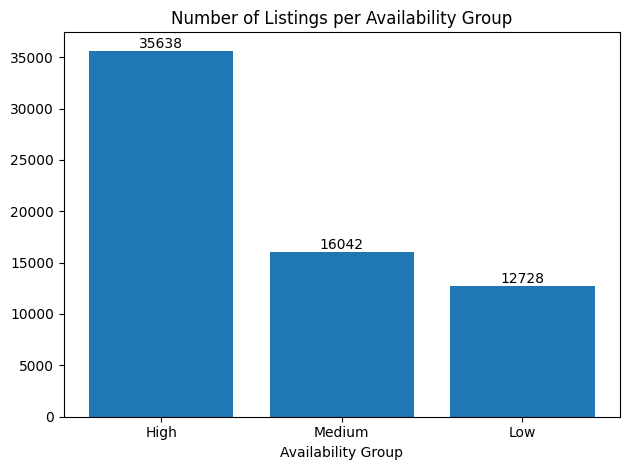

In [25]:
# Group availability into Low, Medium, High categories
df['availability_group'] = pd.cut(
    df['availability 365'],
    bins=[0, 50, 150, 365],
    labels=['Low', 'Medium', 'High']
)
fig, ax = plt.subplots()
bars = ax.bar(
    df['availability_group'].value_counts().index,
    df['availability_group'].value_counts().values,
    color=MAIN_COLOR
)
ax.set_title('Number of Listings per Availability Group')
ax.set_xlabel('Availability Group')
ax.set_ylabel
('Count of Listings')
ax.bar_label(bars, fmt='%d')
plt.tight_layout()
plt.show()






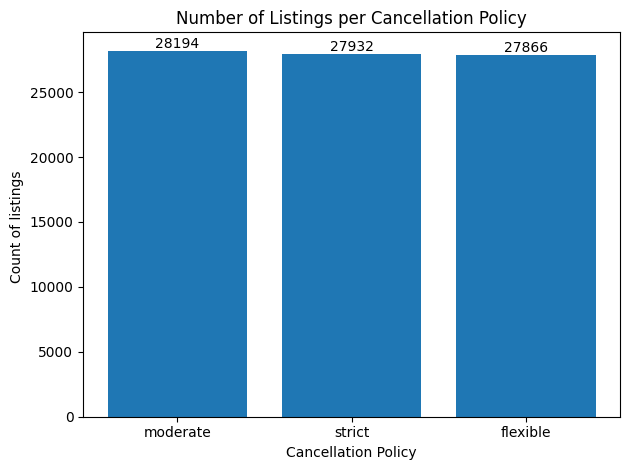

In [26]:
# Count of Cancellation Policies
cancellation_counts = df['cancellation_policy'].value_counts()
fig, ax = plt.subplots()
bars = ax.bar(cancellation_counts.index, cancellation_counts.values, color=MAIN_COLOR)
ax.set_title('Number of Listings per Cancellation Policy')
ax.set_xlabel('Cancellation Policy')
ax.set_ylabel('Count of listings ')
ax.bar_label(bars, fmt='%d') # Display numbers inside the chart
plt.tight_layout() # Adjust layout to prevent labels from being cut off
plt.show()

In [27]:
df

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,house_rules,license,Unnamed: 80,price_per_room,price_per_minimum_night,host_is_big,review_quality_index,popularity_score,occupancy_rate,availability_group
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,United States,...,Clean up and treat the home the way you'd like...,Unknown,0.0,161.0,96.600000,1,0.84,1.89,79,High
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,United States,...,Pet friendly but please confirm with me if the...,Unknown,NaN,71.0,4.733333,0,1.52,17.10,137,High
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,unverified,Elise,Manhattan,Harlem,40.80902,-73.94190,United States,...,"I encourage you to use my kitchen, cooking and...",Unknown,NaN,620.0,206.666667,0,0.00,0.00,13,High
3,1002755,Unknown listing,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.68514,-73.95976,United States,...,No rules provided,Unknown,NaN,368.0,12.266667,0,18.56,1252.80,43,High
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.79851,-73.94399,United States,...,"Please no smoking in the house, porch or on th...",Unknown,NaN,204.0,20.400000,0,0.30,0.90,76,High
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83987,57364103,"A cozy getaway, home away from home",55697801194,verified,Isaiah,Brooklyn,East New York,40.66130,-73.89088,United States,...,No rules provided,Unknown,NaN,147.0,147.000000,0,0.00,0.00,277,Medium
83988,57365208,Cozy bright room near Prospect Park,77326652202,unconfirmed,Mariam,Brooklyn,Flatbush,40.64945,-73.96108,United States,...,Shoes off Clean After yourself Turn Lights and...,Unknown,NaN,696.0,99.428571,0,2.20,5.28,365,NaN
83989,57365760,Private Bedroom with Amazing Rooftop View,45936254757,verified,Trey,Brooklyn,Bushwick,40.69872,-73.92718,United States,...,#NAME?,Unknown,NaN,454.5,909.000000,0,2.16,13.68,365,NaN
83990,57366313,Pretty Brooklyn One-Bedroom for 2 to 4 people,23801060917,verified,Michael,Brooklyn,Bedford-Stuyvesant,40.67810,-73.90822,United States,...,* Check out: 10am * We made an effort to keep ...,Unknown,NaN,193.5,193.500000,0,12.48,156.00,130,High


EDA Analysis

In [28]:
# Helper: add value labels on top of matplotlib bars
def add_bar_labels(ax):
    for p in ax.patches:
        height = p.get_height()
        ax.annotate(f'{height:.0f}',
                    (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='bottom', fontsize=8)

## 1️⃣ Market Size – Number of Listings

In [29]:
total_listings = len(df)
print(f'Total number of listings: {total_listings}')

Total number of listings: 83992


## 2️⃣ Supply by Area – Listings per Neighbourhood Group

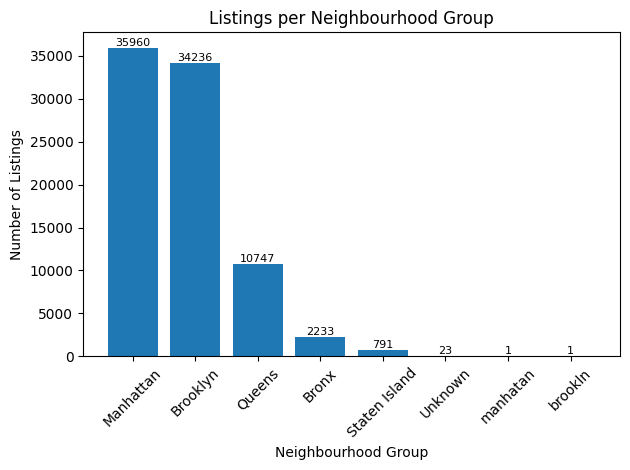

In [30]:
area_counts = df['neighbourhood group'].value_counts().sort_values(ascending=False)

fig, ax = plt.subplots()
bars = ax.bar(area_counts.index, area_counts.values, color=MAIN_COLOR)
ax.set_title('Listings per Neighbourhood Group')
ax.set_xlabel('Neighbourhood Group')
ax.set_ylabel('Number of Listings')
plt.xticks(rotation=45)
add_bar_labels(ax)
plt.tight_layout()
plt.show()

## 3️⃣ Supply by Room Type – What Do Hosts Offer?

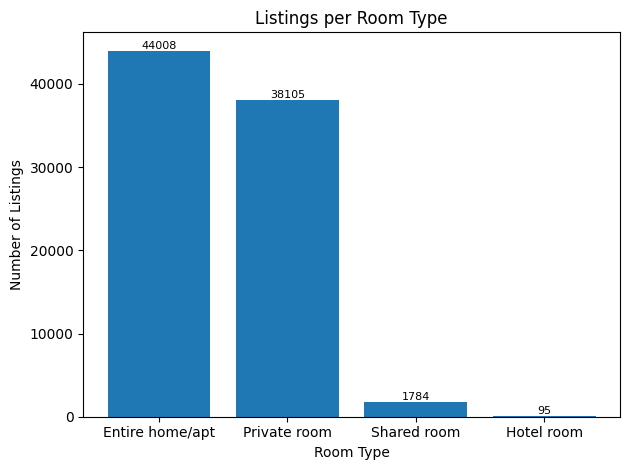

In [31]:
room_counts = df['room type'].value_counts()

fig, ax = plt.subplots()
bars = ax.bar(room_counts.index, room_counts.values, color=MAIN_COLOR)
ax.set_title('Listings per Room Type')
ax.set_xlabel('Room Type')
ax.set_ylabel('Number of Listings')
add_bar_labels(ax)
plt.tight_layout()
plt.show()

## 4️⃣ Listings by Country

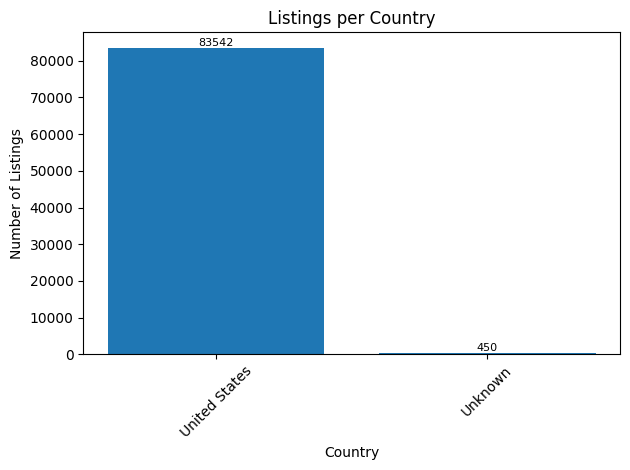

In [32]:
country_counts = df['country'].value_counts()

fig, ax = plt.subplots()
bars = ax.bar(country_counts.index, country_counts.values, color=MAIN_COLOR)
ax.set_title('Listings per Country')
ax.set_xlabel('Country')
ax.set_ylabel('Number of Listings')
plt.xticks(rotation=45)
add_bar_labels(ax)
plt.tight_layout()
plt.show()

## 5️⃣ Price Distribution – How Expensive Are Listings?

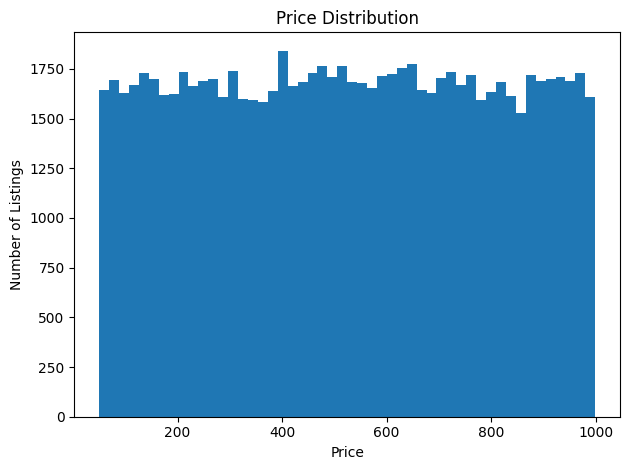

In [33]:
plt.figure()
plt.hist(df['price'].dropna(), bins=50, color=MAIN_COLOR)
plt.title('Price Distribution')
plt.xlabel('Price')
plt.ylabel('Number of Listings')
plt.tight_layout()
plt.show()

## 6️⃣ Price by Room Type – Which Type Is More Expensive?

/tmp/ipython-input-1400303092.py:5: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data, labels=room_types)


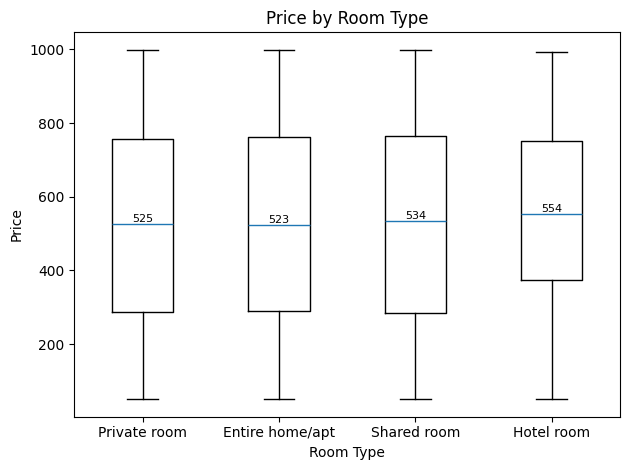

In [34]:
fig, ax = plt.subplots()
room_types = df['room type'].unique()
data = [df[df['room type'] == rt]['price'].dropna() for rt in room_types]

bp = ax.boxplot(data, labels=room_types)
ax.set_title('Price by Room Type')
ax.set_xlabel('Room Type')
ax.set_ylabel('Price')

# add median values on the boxplot
medians = [np.median(d) for d in data]
for i, med in enumerate(medians, start=1):
    ax.text(i, med, f"{med:.0f}", ha="center", va="bottom", fontsize=8)

plt.tight_layout()
plt.show()

## 7️⃣ Average Price by Neighbourhood Group

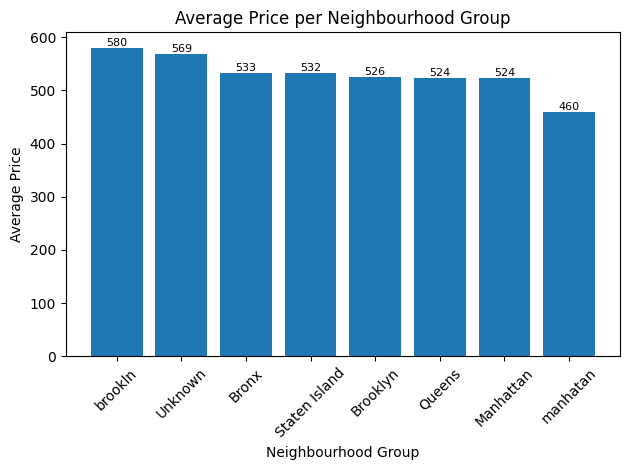

In [35]:
avg_price_area = df.groupby('neighbourhood group')['price'].mean().sort_values(ascending=False)

fig, ax = plt.subplots()
bars = ax.bar(avg_price_area.index, avg_price_area.values, color=MAIN_COLOR)
ax.set_title('Average Price per Neighbourhood Group')
ax.set_xlabel('Neighbourhood Group')
ax.set_ylabel('Average Price')
plt.xticks(rotation=45)
add_bar_labels(ax)
plt.tight_layout()
plt.show()

## 8️⃣ Average Price by Availability Group

/tmp/ipython-input-1383275193.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  avg_price_avail = df.groupby('availability_group')['price'].mean().sort_values(ascending=False)


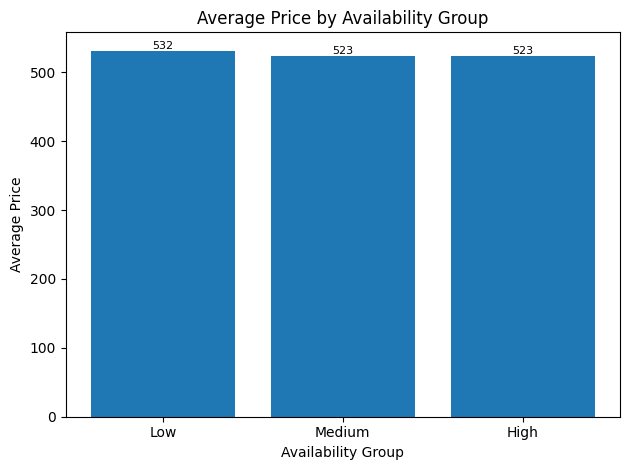

In [36]:
avg_price_avail = df.groupby('availability_group')['price'].mean().sort_values(ascending=False)

fig, ax = plt.subplots()
bars = ax.bar(avg_price_avail.index.astype(str), avg_price_avail.values, color=MAIN_COLOR)
ax.set_title('Average Price by Availability Group')
ax.set_xlabel('Availability Group')
ax.set_ylabel('Average Price')
add_bar_labels(ax)
plt.tight_layout()
plt.show()

## 9️⃣ Minimum Nights – How Long Do Guests Need to Stay?

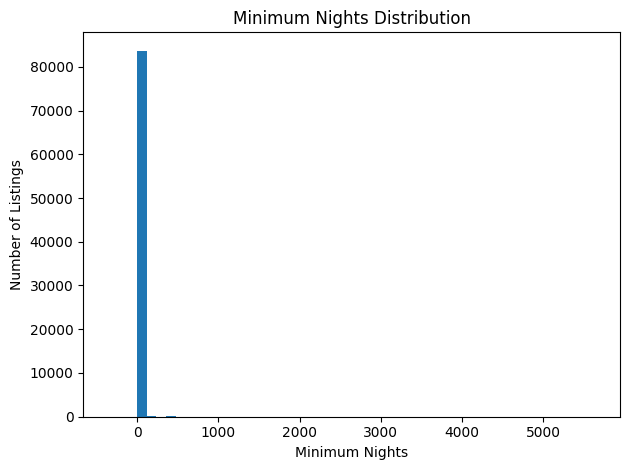

In [37]:
plt.figure()
plt.hist(df['minimum nights'].dropna(), bins=50, color=MAIN_COLOR)
plt.title('Minimum Nights Distribution')
plt.xlabel('Minimum Nights')
plt.ylabel('Number of Listings')
plt.tight_layout()
plt.show()

## 🔟 Availability 365 – How Often Are Listings Available?

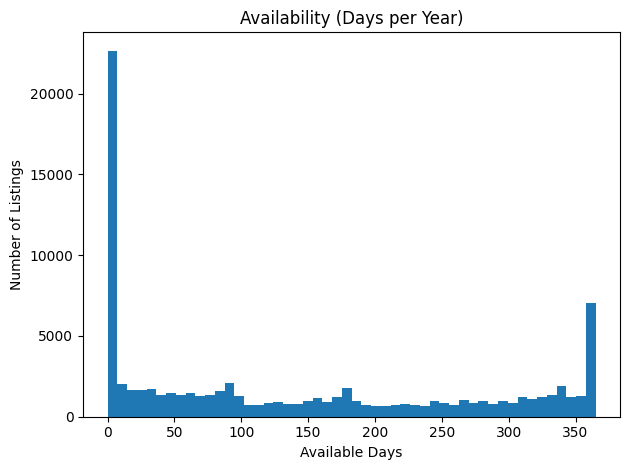

In [38]:
plt.figure()
plt.hist(df['availability 365'].dropna(), bins=50, color=MAIN_COLOR)
plt.title('Availability (Days per Year)')
plt.xlabel('Available Days')
plt.ylabel('Number of Listings')
plt.tight_layout()
plt.show()

## 1️⃣1️⃣ Price vs Availability – Expensive Listings More or Less Available?

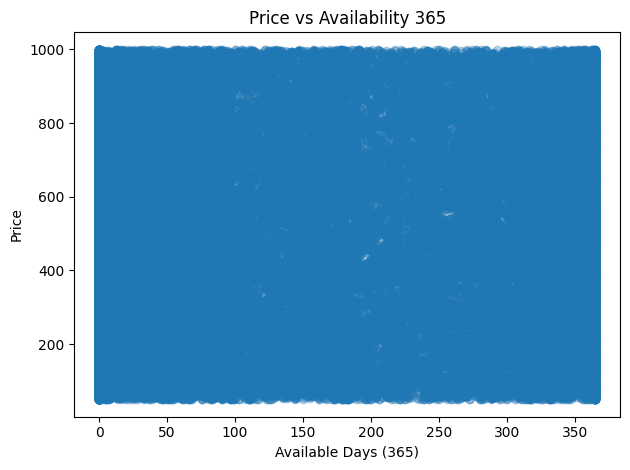

In [39]:
plt.figure()
plt.scatter(df['availability 365'], df['price'], alpha=0.3, color=MAIN_COLOR)
plt.title('Price vs Availability 365')
plt.xlabel('Available Days (365)')
plt.ylabel('Price')
plt.tight_layout()
plt.show()

## 1️⃣2️⃣ Price vs Minimum Nights

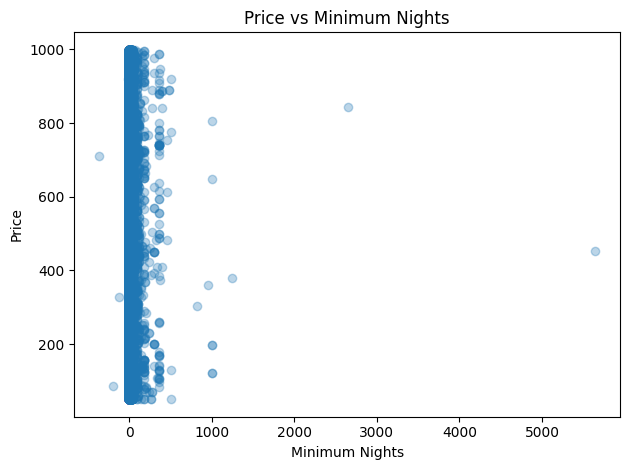

In [40]:
plt.figure()
plt.scatter(df['minimum nights'], df['price'], alpha=0.3, color=MAIN_COLOR)
plt.title('Price vs Minimum Nights')
plt.xlabel('Minimum Nights')
plt.ylabel('Price')
plt.tight_layout()
plt.show()

## 1️⃣3️⃣ Rating Distribution – Review Scores

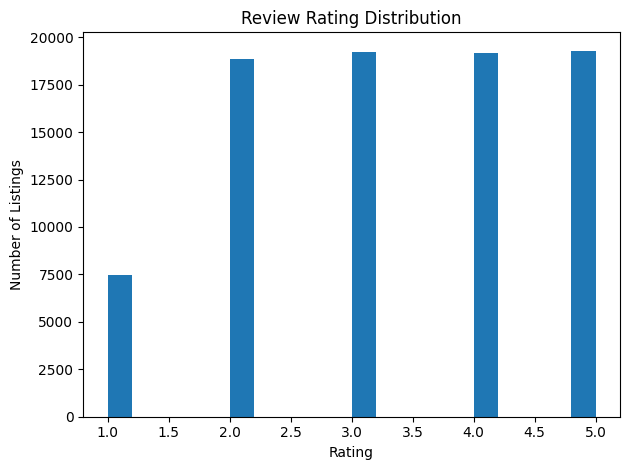

In [41]:
plt.figure()
plt.hist(df['review rate number'].dropna(), bins=20, color=MAIN_COLOR)
plt.title('Review Rating Distribution')
plt.xlabel('Rating')
plt.ylabel('Number of Listings')
plt.tight_layout()
plt.show()

## 1️⃣4️⃣ Average Rating by Room Type

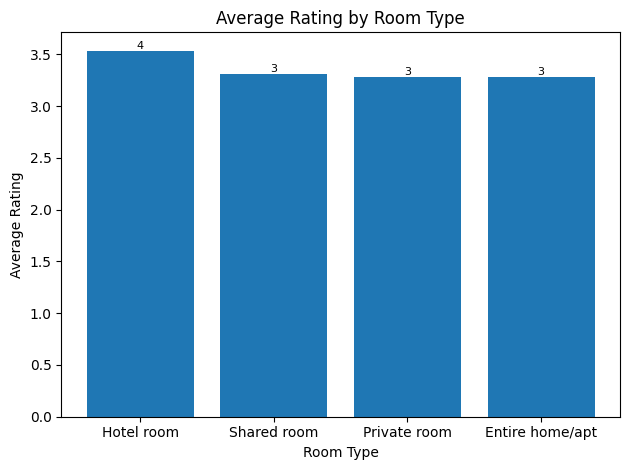

In [42]:
avg_rating_room = df.groupby('room type')['review rate number'].mean().sort_values(ascending=False)

fig, ax = plt.subplots()
bars = ax.bar(avg_rating_room.index, avg_rating_room.values, color=MAIN_COLOR)
ax.set_title('Average Rating by Room Type')
ax.set_xlabel('Room Type')
ax.set_ylabel('Average Rating')
add_bar_labels(ax)
plt.tight_layout()
plt.show()

## 1️⃣5️⃣ Number of Reviews – Engagement Level

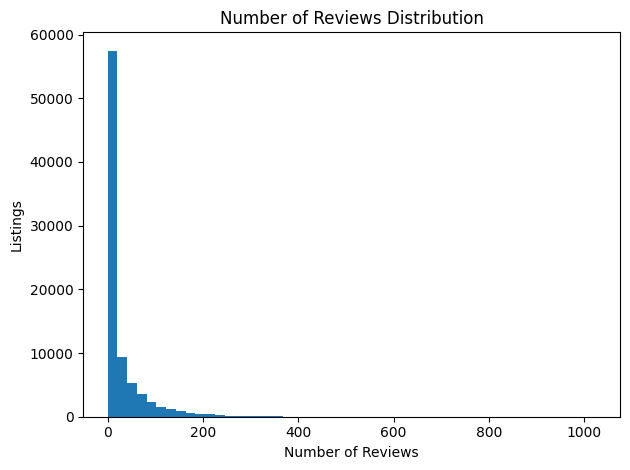

In [43]:
plt.figure()
plt.hist(df['number of reviews'].dropna(), bins=50, color=MAIN_COLOR)
plt.title('Number of Reviews Distribution')
plt.xlabel('Number of Reviews')
plt.ylabel('Listings')
plt.tight_layout()
plt.show()

## 1️⃣6️⃣ Popularity Score Distribution

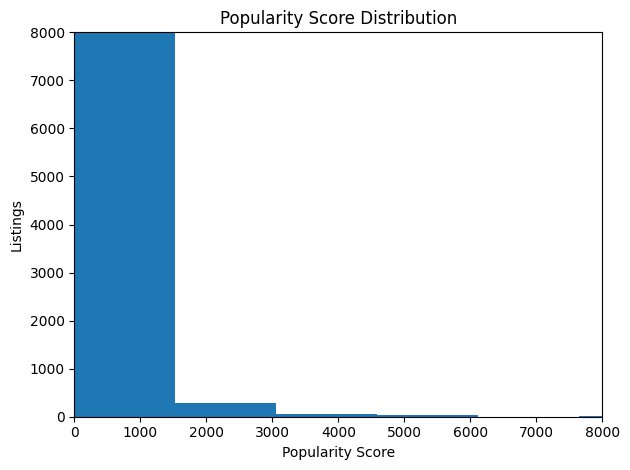

In [63]:
plt.figure()
plt.hist(df['popularity_score'].dropna(), bins=50, color=MAIN_COLOR)
plt.title('Popularity Score Distribution')
plt.xlabel('Popularity Score')
plt.ylabel('Listings')
plt.xlim(0, 8000)
plt.ylim(0,8000)
plt.tight_layout()
plt.show()

## 1️⃣7️⃣ Occupancy Rate – How Booked Are Listings?

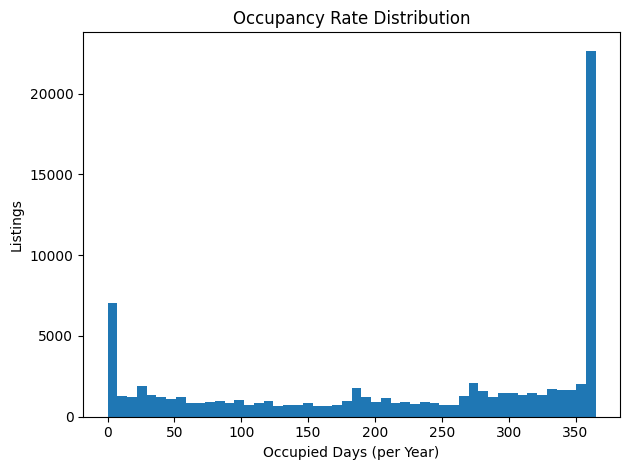

In [45]:
plt.figure()
plt.hist(df['occupancy_rate'].dropna(), bins=50, color=MAIN_COLOR)
plt.title('Occupancy Rate Distribution')
plt.xlabel('Occupied Days (per Year)')
plt.ylabel('Listings')
plt.tight_layout()
plt.show()

## 1️⃣8️⃣ Big Hosts vs Small Hosts – Market Control

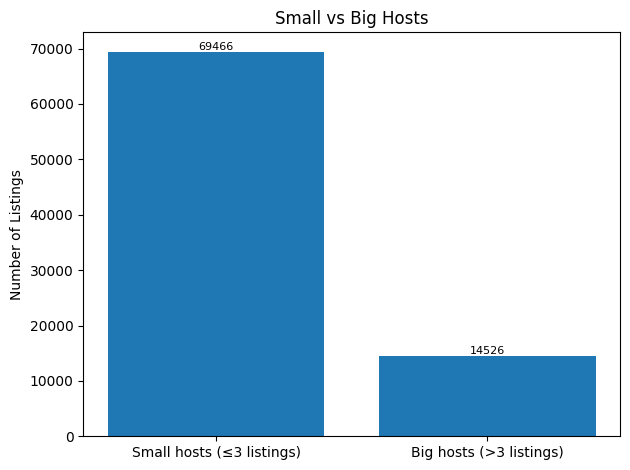

In [46]:
host_counts = df['host_is_big'].value_counts().sort_index()
labels = ['Small hosts (≤3 listings)', 'Big hosts (>3 listings)']

fig, ax = plt.subplots()
bars = ax.bar(labels, host_counts.values, color=MAIN_COLOR)
ax.set_title('Small vs Big Hosts')
ax.set_ylabel('Number of Listings')
add_bar_labels(ax)
plt.tight_layout()
plt.show()

## 1️⃣9️⃣ Average Price – Big Hosts vs Small Hosts

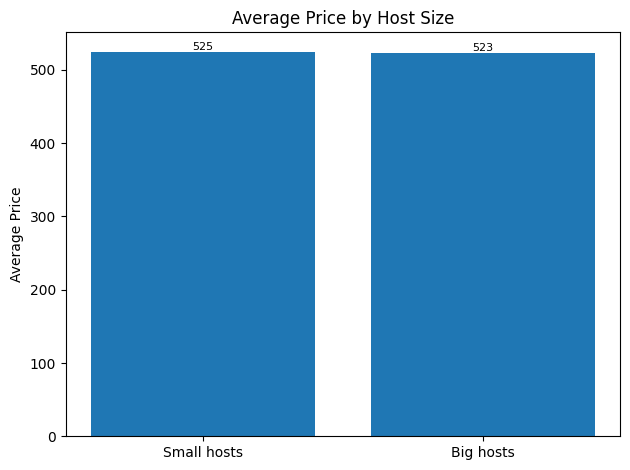

In [47]:
avg_price_host = df.groupby('host_is_big')['price'].mean()

fig, ax = plt.subplots()
bars = ax.bar(['Small hosts', 'Big hosts'], avg_price_host.values, color=MAIN_COLOR)
ax.set_title('Average Price by Host Size')
ax.set_ylabel('Average Price')
add_bar_labels(ax)
plt.tight_layout()
plt.show()

## 2️⃣0️⃣ Effective Price per Minimum Stay Night

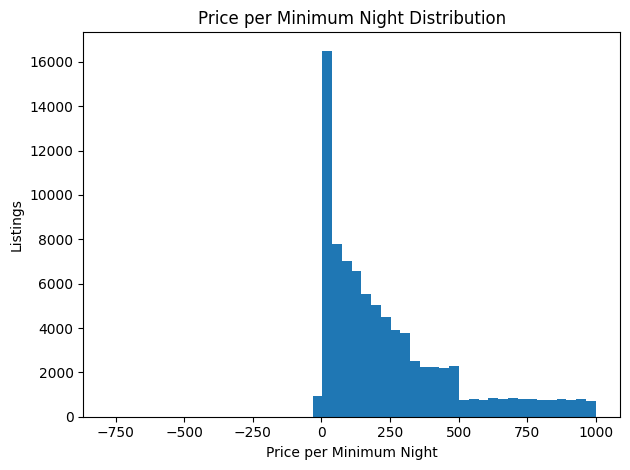

In [48]:
plt.figure()
plt.hist(df['price_per_minimum_night'].dropna(), bins=50, color=MAIN_COLOR)
plt.title('Price per Minimum Night Distribution')
plt.xlabel('Price per Minimum Night')
plt.ylabel('Listings')
plt.tight_layout()
plt.show()

## 2️⃣1️⃣ Price per Host Listing

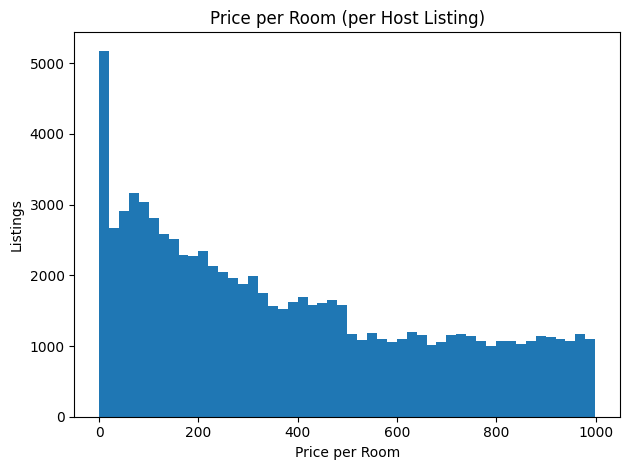

In [49]:
plt.figure()
plt.hist(df['price_per_room'].dropna(), bins=50, color=MAIN_COLOR)
plt.title('Price per Room (per Host Listing)')
plt.xlabel('Price per Room')
plt.ylabel('Listings')
plt.tight_layout()
plt.show()

## 2️⃣2️⃣ Correlation Between Key Numeric Variables

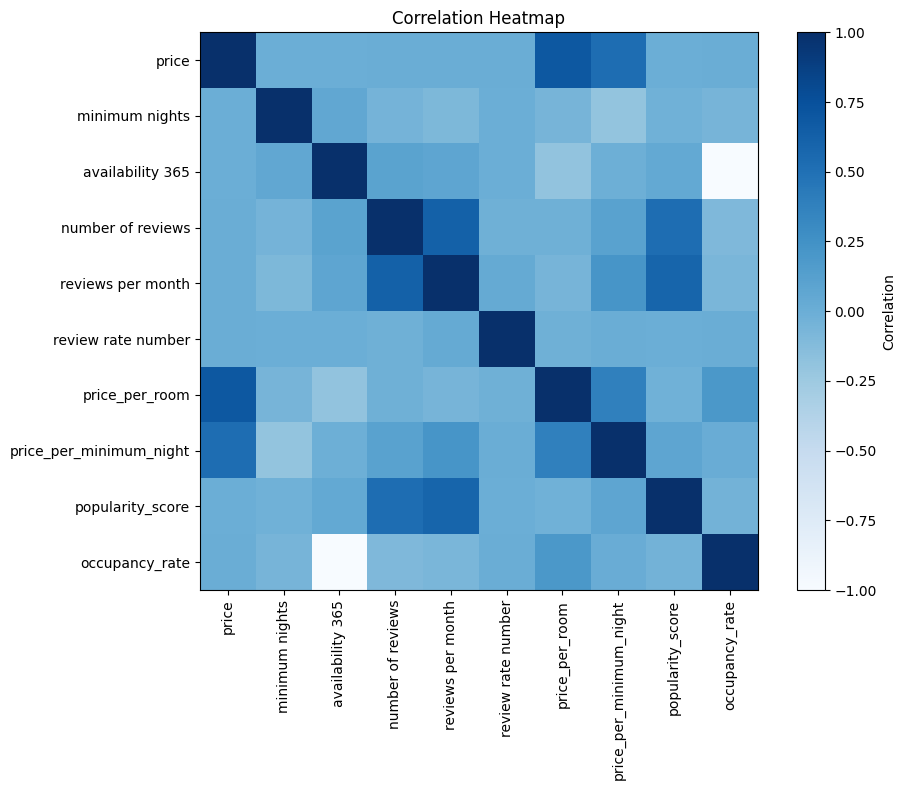

In [50]:
numeric_cols = ['price', 'minimum nights', 'availability 365',
                 'number of reviews', 'reviews per month',
                 'review rate number', 'price_per_room',
                 'price_per_minimum_night', 'popularity_score',
                 'occupancy_rate']

corr = df[numeric_cols].corr()

plt.figure(figsize=(10,8))
plt.imshow(corr, cmap='Blues')
plt.colorbar(label='Correlation')
plt.xticks(range(len(numeric_cols)), numeric_cols, rotation=90)
plt.yticks(range(len(numeric_cols)), numeric_cols)
plt.title('Correlation Heatmap')
plt.tight_layout()
plt.show()

## 2️⃣3️⃣ Top 10 Neighbourhoods by Number of Listings

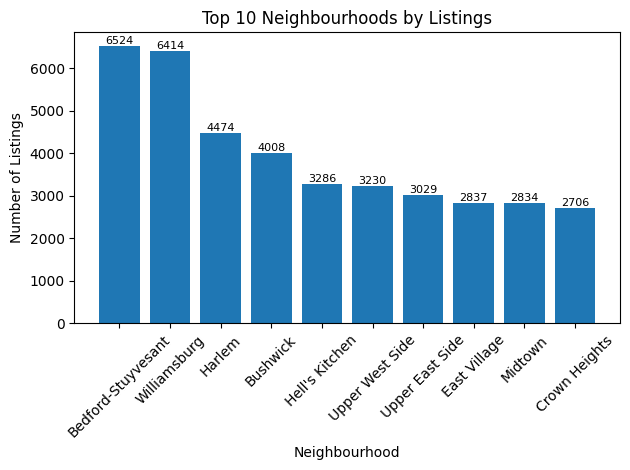

In [51]:
top_neigh = df['neighbourhood'].value_counts().head(10)

fig, ax = plt.subplots()
bars = ax.bar(top_neigh.index, top_neigh.values, color=MAIN_COLOR)
ax.set_title('Top 10 Neighbourhoods by Listings')
ax.set_xlabel('Neighbourhood')
ax.set_ylabel('Number of Listings')
plt.xticks(rotation=45)
add_bar_labels(ax)
plt.tight_layout()
plt.show()

## 2️⃣4️⃣ Price vs Rating (Interactive – Plotly)

In [52]:
fig = px.scatter(
    df,
    x='review rate number',
    y='price',
    hover_name='NAME',
    title='Price vs Rating',
    color_discrete_sequence=[MAIN_COLOR],
    opacity=0.5
)
fig.show()

## 2️⃣5️⃣ Geographic View – Listings on the Map (Plotly)

In [53]:
fig = px.scatter_geo(
    df.dropna(subset=['lat','long']),
    lat='lat',
    lon='long',
    color='price',
    title='Listings by Location (colored by Price)',
    color_continuous_scale='Blues',
    hover_name='NAME'
)
fig.show()

Text(0, 0.5, 'Price')

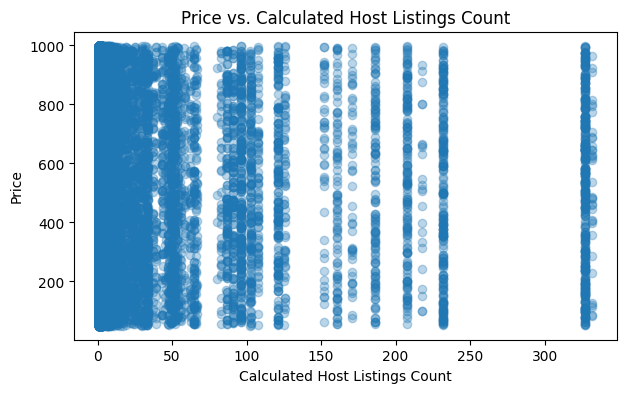

In [54]:
plt.figure(figsize=(7,4))
plt.scatter(df['calculated host listings count'], df['price'], alpha=0.3, color=MAIN_COLOR)

plt.title('Price vs. Calculated Host Listings Count')
plt.xlabel('Calculated Host Listings Count')
plt.ylabel('Price')

In [55]:
# Save final cleaned + engineered dataset to CSV
df.to_csv("Airbnb_Open_Data_final_features.csv", index=False)
print("Saved as Airbnb_Open_Data_final_features.csv")


Saved as Airbnb_Open_Data_final_features.csv
